## CO2 emissions

In [1]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf

C:\Users\kathr\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
C:\Users\kathr\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


#### Annual CO2 emissions and contributions from each country

In [2]:
df1 = pd.read_csv('annual-co-emissions-by-region.csv')
remove_list = ['Asia (excl. China & India)','Asia','EU-27','EU-28','Europe (excl. EU-27)','Europe (excl. EU-28)','Oceania','North America','North America (excl. USA)', 'World', 'High-income countries', 'European Union', 'Upper-middle-income countries', 'European Union (27)', 'European Union (28)', 'Africa', 'South America', 'Lower-middle-income countries','International transport','Europe', 'Low-income countries']
df1 = df1[~df1['Entity'].isin(remove_list)]
df1 = df1.sort_values('Annual CO2 emissions (zero filled)', ascending = False)
df1 = df1.rename(columns={'Annual CO2 emissions (zero filled)': "Annual CO2 emissions"})

In [3]:
fig = px.area(df1, x="Year", y="Annual CO2 emissions", color="Entity")
fig.update_layout(showlegend=False)
fig.show()

#### Cumulative CO2 distribution

In [4]:
df2 = pd.read_csv('cumulative-co2-emissions-region.csv')
remove_list = ['Asia (excl. China & India)','Asia','EU-27','EU-28','Europe (excl. EU-27)','Europe (excl. EU-28)','Oceania','North America','North America (excl. USA)', 'World', 'High-income countries', 'European Union', 'Upper-middle-income countries', 'European Union (27)', 'European Union (28)', 'Africa', 'South America', 'Lower-middle-income countries','International transport','Europe', 'Low-income countries']
df2 = df2[~df2['Entity'].isin(remove_list)]
df2 = df2.sort_values('Cumulative CO2 emissions (zero filled)', ascending = False)
df2 = df2.rename(columns={'Cumulative CO2 emissions (zero filled)': "Cumulative CO2 emissions"})

In [5]:
fig = px.area(df2, x="Year", y="Cumulative CO2 emissions", color="Entity")
fig.update_layout(showlegend=False)
fig.show()
# y-axis unit in trillion tons CO2

#### Cumulative distribution by percent

In [6]:
fig = px.area(df2, x="Year", y="Cumulative CO2 emissions", color="Entity", groupnorm = 'percent')
fig.update_layout(showlegend=False)
fig.show()

#### TSA on global CO2 emissions

In [16]:
df3 = pd.read_csv('annual-co-emissions-by-region.csv')
df3 = df3.rename(columns={'Annual CO2 emissions (zero filled)': "Annual CO2 emissions"})
df3 = df3.loc[df3['Entity'] == 'World']
df3 = df3.sort_values('Year')

In [17]:
px.line(df3, x = 'Year', y = 'Annual CO2 emissions')

#### First order difference to account for increasing trend

In [21]:
diff1 = np.diff(df3['Annual CO2 emissions']) 
df3['First order differenced CO2 emissions'] = np.pad(diff1, (0, 1), 'constant')
px.line(df3, x = 'Year', y = 'First order differenced CO2 emissions')

#### Log transformation to account for increasing variance

In [19]:
e = 1e-10
df3['Log Transformed First order differenced CO2 emissions'] = np.log(abs(df3['First order differenced CO2 emissions']+e))
px.line(df3, x = 'Year', y = 'Log Transformed First order differenced CO2 emissions')

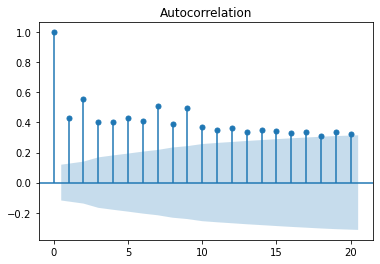

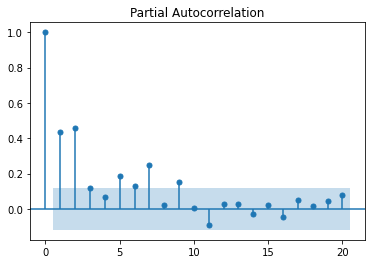

In [11]:
acf = plot_acf(df3['Log Transformed First order differenced CO2 emissions'], lags = 20)
pacf = plot_pacf(df3['Log Transformed First order differenced CO2 emissions'], lags = 20)
plt.show(acf)
plt.show(pacf)